In [1]:
import os 

os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"   # see issue #152
os.environ["CUDA_VISIBLE_DEVICES"]="0"
#os.environ["CUDA_LAUNCH_BLOCKING"] = 1

import random
import numpy as np
import matplotlib.pyplot as plt

import json
import cv2
from tqdm import tqdm
from PIL import Image

PATH = "/home/faisal/7.1.e_optha_EX"
train_image_dir = os.path.join(PATH, "training/images")
train_ann_dir = os.path.join(PATH, "training/ground_truth/Hard Exudates")
val_image_dir = os.path.join(PATH, "validation/images")
val_ann_dir = os.path.join(PATH, "validation/ground_truth/Hard Exudates")
test_image_dir = os.path.join(PATH, "test/images")
test_ann_dir = os.path.join(PATH, "test/ground_truth/Hard Exudates")
train_image_names = sorted(os.listdir(train_image_dir))
train_ann_names = sorted(os.listdir(train_ann_dir))
val_image_names = sorted(os.listdir(val_image_dir))
val_ann_names = sorted(os.listdir(val_ann_dir))
test_image_names = sorted(os.listdir(test_image_dir))
test_ann_names = sorted(os.listdir(test_ann_dir))



import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms.functional as TF 
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2

class SEGDataset(Dataset):
    def __init__(self, image_dir, ann_dir, image_names_list, ann_names_list, transform = None):
        super(SEGDataset, self).__init__()
        self.image_dir = image_dir
        self.ann_dir = ann_dir
        self.images = image_names_list
        self.anns = ann_names_list
        self.transform = transform
    def __len__(self):
        return len(self.images)
    def __getitem__(self, index):
        image_path = os.path.join(self.image_dir, self.images[index])
        ann_path = os.path.join(self.ann_dir, self.anns[index])
        
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        mask = cv2.imread(ann_path, cv2.IMREAD_GRAYSCALE)
        #mask = Image.open(ann_path)
        #mask = np.array(mask)
        mask[mask > 1] = 1
        mask[mask < 1] = 0
        '''ann_file = open(ann_path)
        ann_data = json.load(ann_file)
        #tile_example(img_path, mask_rle, ex_id, organ, 
        mask = np.zeros(shape = image.shape[:-1])
        for idx in range(len(ann_data)):
            ann = [np.array(ann_data[idx], dtype = np.int32)]
            cv2.fillPoly(mask, pts = ann, color = (255, 255, 255))'''
        
        # mask[mask >= 128.0] = 1
        # mask[mask < 128.0] = 0
        
        if self.transform is not None:
            transformer = self.transform(image = image, mask = mask)
            image, mask = transformer["image"], transformer["mask"]
            
        return image, mask
    
#Splitting into train and val sets
random.seed(53)
np.random.seed(53)
torch.manual_seed(53)
'''np.random.shuffle(image_names)
N = len(image_names)
train_len = int(0.9 * N)
val_len = N - train_len'''
#train_image_names = image_names[:train_len]
#val_image_names = image_names[train_len:]
#print(f"No. of training images = {train_len}")
#print(f"No. of validation images = {val_len}")

def get_dataloaders(img_size = 256, batch_size = 16, image_dir = None, ann_dir = None, train_image_dir = None, val_ann_dir = None, test_ann_dir = None,
                    train_image_names = None, train_ann_names = None, val_image_names = None, val_ann_names = None, test_image_names = None, test_ann_names = None):
    
    
    train_transforms = A.Compose([
        A.PadIfNeeded(min_height=2544, min_width=2544, p=1),
        A.CenterCrop(p=1, height=2048, width=2048),
        A.Resize(height = img_size, width = img_size, always_apply =True),
        A.HorizontalFlip(p = 0.5),
        A.VerticalFlip(p = 0.5),
        A.Rotate(limit = 90, p = 0.5),
        A.Normalize(
        mean = (0, 0, 0), std = (1.0, 1.0, 1.0), max_pixel_value = 255.0
        ),
        ToTensorV2()
    ])
    val_transforms = A.Compose([
        A.PadIfNeeded(min_height=2544, min_width=2544, border_mode=cv2.BORDER_CONSTANT, p=1),
        A.CenterCrop(p=1, height=2048, width=2048),
        A.Resize(height = img_size, width = img_size, always_apply =True),
        A.Normalize(
        mean = (0, 0, 0), std = (1.0, 1.0, 1.0), max_pixel_value = 255.0
        ),
        ToTensorV2()
    ])
    test_transforms = A.Compose([
        A.PadIfNeeded(min_height=2544, min_width=2544, border_mode=cv2.BORDER_CONSTANT, p=1),
        A.CenterCrop(p=1, height=2048, width=2048),
        A.Resize(height = img_size, width = img_size, always_apply =True),
        A.Normalize(
        mean = (0, 0, 0), std = (1.0, 1.0, 1.0), max_pixel_value = 255.0
        ),
        ToTensorV2()
    ])
    

    train_dataset = SEGDataset(image_dir, ann_dir, train_image_names, train_ann_names, train_transforms)
    val_dataset = SEGDataset(val_image_dir, val_ann_dir, val_image_names, val_ann_names, val_transforms)
    test_dataset = SEGDataset(test_image_dir, test_ann_dir, test_image_names, test_ann_names, test_transforms)

    g_seed = torch.Generator()
    g_seed.manual_seed(0)

    train_loader = DataLoader(train_dataset, batch_size = batch_size, shuffle = True, pin_memory = True, num_workers = 8)
    val_loader = DataLoader(val_dataset, batch_size = batch_size, shuffle = False, pin_memory = True, num_workers = 8)
    test_loader = DataLoader(test_dataset, batch_size = batch_size, shuffle = False, pin_memory = True, num_workers = 8)
    
    return train_loader, val_loader, test_loader

/home/faisal/.conda/envs/faisalk/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# UNext

In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
from torchvision import transforms,datasets
import torch.optim as optim
from torch.autograd import Variable
from torch.optim.lr_scheduler import ReduceLROnPlateau
#from focal_loss.focal_loss import FocalLoss
import torchvision


import sys
#from torchsummary import summary
from ptflops import get_model_complexity_info
from torchinfo import summary
from torchstat import stat
from timm.models.layers import DropPath, to_2tuple, trunc_normal_

import matplotlib.pyplot as plt
import time
from torchvision import models

import math


def conv1x1(in_planes: int, out_planes: int, stride: int = 1) -> nn.Conv2d:
    """1x1 convolution"""
    return nn.Conv2d(in_planes, out_planes, kernel_size=1, stride=1, bias=False)


def shift(dim):
            x_shift = [ torch.roll(x_c, shift, dim) for x_c, shift in zip(xs, range(-self.pad, self.pad+1))]
            x_cat = torch.cat(x_shift, 1)
            x_cat = torch.narrow(x_cat, 2, self.pad, H)
            x_cat = torch.narrow(x_cat, 3, self.pad, W)
            return x_cat

class shiftmlp(nn.Module):
    def __init__(self, in_features, hidden_features=None, out_features=None, act_layer=nn.GELU, drop=0., shift_size=5):
        super().__init__()
        out_features = out_features or in_features
        hidden_features = hidden_features or in_features
        self.dim = in_features
        self.fc1 = nn.Linear(in_features, hidden_features)
        self.dwconv = DWConv(hidden_features)
        self.act = act_layer()
        self.fc2 = nn.Linear(hidden_features, out_features)
        self.drop = nn.Dropout(drop)

        self.shift_size = shift_size
        self.pad = shift_size // 2

        
        self.apply(self._init_weights)

    def _init_weights(self, m):
        if isinstance(m, nn.Linear):
            trunc_normal_(m.weight, std=.02)
            if isinstance(m, nn.Linear) and m.bias is not None:
                nn.init.constant_(m.bias, 0)
        elif isinstance(m, nn.LayerNorm):
            nn.init.constant_(m.bias, 0)
            nn.init.constant_(m.weight, 1.0)
        elif isinstance(m, nn.Conv2d):
            fan_out = m.kernel_size[0] * m.kernel_size[1] * m.out_channels
            fan_out //= m.groups
            m.weight.data.normal_(0, math.sqrt(2.0 / fan_out))
            if m.bias is not None:
                m.bias.data.zero_()
    
#     def shift(x, dim):
#         x = F.pad(x, "constant", 0)
#         x = torch.chunk(x, shift_size, 1)
#         x = [ torch.roll(x_c, shift, dim) for x_s, shift in zip(x, range(-pad, pad+1))]
#         x = torch.cat(x, 1)
#         return x[:, :, pad:-pad, pad:-pad]

    def forward(self, x, H, W):
        # pdb.set_trace()
        B, N, C = x.shape

        xn = x.transpose(1, 2).view(B, C, H, W).contiguous()
        xn = F.pad(xn, (self.pad, self.pad, self.pad, self.pad) , "constant", 0)
        xs = torch.chunk(xn, self.shift_size, 1)
        x_shift = [torch.roll(x_c, shift, 2) for x_c, shift in zip(xs, range(-self.pad, self.pad+1))]
        x_cat = torch.cat(x_shift, 1)
        x_cat = torch.narrow(x_cat, 2, self.pad, H)
        x_s = torch.narrow(x_cat, 3, self.pad, W)


        x_s = x_s.reshape(B,C,H*W).contiguous()
        x_shift_r = x_s.transpose(1,2)


        x = self.fc1(x_shift_r)

        x = self.dwconv(x, H, W)
        x = self.act(x) 
        x = self.drop(x)

        xn = x.transpose(1, 2).view(B, C, H, W).contiguous()
        xn = F.pad(xn, (self.pad, self.pad, self.pad, self.pad) , "constant", 0)
        xs = torch.chunk(xn, self.shift_size, 1)
        x_shift = [torch.roll(x_c, shift, 3) for x_c, shift in zip(xs, range(-self.pad, self.pad+1))]
        x_cat = torch.cat(x_shift, 1)
        x_cat = torch.narrow(x_cat, 2, self.pad, H)
        x_s = torch.narrow(x_cat, 3, self.pad, W)
        x_s = x_s.reshape(B,C,H*W).contiguous()
        x_shift_c = x_s.transpose(1,2)

        x = self.fc2(x_shift_c)
        x = self.drop(x)
        return x



class shiftedBlock(nn.Module):
    def __init__(self, dim, num_heads, mlp_ratio=4., qkv_bias=False, qk_scale=None, drop=0., attn_drop=0.,
                 drop_path=0., act_layer=nn.GELU, norm_layer=nn.LayerNorm, sr_ratio=1):
        super().__init__()


        self.drop_path = DropPath(drop_path) if drop_path > 0. else nn.Identity()
        self.norm2 = norm_layer(dim)
        mlp_hidden_dim = int(dim * mlp_ratio)
        self.mlp = shiftmlp(in_features=dim, hidden_features=mlp_hidden_dim, act_layer=act_layer, drop=drop)
        self.apply(self._init_weights)

    def _init_weights(self, m):
        if isinstance(m, nn.Linear):
            trunc_normal_(m.weight, std=.02)
            if isinstance(m, nn.Linear) and m.bias is not None:
                nn.init.constant_(m.bias, 0)
        elif isinstance(m, nn.LayerNorm):
            nn.init.constant_(m.bias, 0)
            nn.init.constant_(m.weight, 1.0)
        elif isinstance(m, nn.Conv2d):
            fan_out = m.kernel_size[0] * m.kernel_size[1] * m.out_channels
            fan_out //= m.groups
            m.weight.data.normal_(0, math.sqrt(2.0 / fan_out))
            if m.bias is not None:
                m.bias.data.zero_()

    def forward(self, x, H, W):

        x = x + self.drop_path(self.mlp(self.norm2(x), H, W))
        return x


class DWConv(nn.Module):
    def __init__(self, dim=768):
        super(DWConv, self).__init__()
        self.dwconv = nn.Conv2d(dim, dim, 3, 1, 1, bias=True, groups=dim)

    def forward(self, x, H, W):
        B, N, C = x.shape
        x = x.transpose(1, 2).view(B, C, H, W)
        x = self.dwconv(x)
        x = x.flatten(2).transpose(1, 2)

        return x

class OverlapPatchEmbed(nn.Module):
    """ Image to Patch Embedding
    """

    def __init__(self, img_size=224, patch_size=7, stride=4, in_chans=3, embed_dim=768):
        super().__init__()
        img_size = to_2tuple(img_size)
        patch_size = to_2tuple(patch_size)

        self.img_size = img_size
        self.patch_size = patch_size
        self.H, self.W = img_size[0] // patch_size[0], img_size[1] // patch_size[1]
        self.num_patches = self.H * self.W
        self.proj = nn.Conv2d(in_chans, embed_dim, kernel_size=patch_size, stride=stride,
                              padding=(patch_size[0] // 2, patch_size[1] // 2))
        self.norm = nn.LayerNorm(embed_dim)

        self.apply(self._init_weights)

    def _init_weights(self, m):
        if isinstance(m, nn.Linear):
            trunc_normal_(m.weight, std=.02)
            if isinstance(m, nn.Linear) and m.bias is not None:
                nn.init.constant_(m.bias, 0)
        elif isinstance(m, nn.LayerNorm):
            nn.init.constant_(m.bias, 0)
            nn.init.constant_(m.weight, 1.0)
        elif isinstance(m, nn.Conv2d):
            fan_out = m.kernel_size[0] * m.kernel_size[1] * m.out_channels
            fan_out //= m.groups
            m.weight.data.normal_(0, math.sqrt(2.0 / fan_out))
            if m.bias is not None:
                m.bias.data.zero_()

    def forward(self, x):
        x = self.proj(x)
        _, _, H, W = x.shape
        x = x.flatten(2).transpose(1, 2)
        x = self.norm(x)

        return x, H, W


class UNext(nn.Module):

    ## Conv 3 + MLP 2 + shifted MLP
    
    def __init__(self,  num_classes, input_channels=3, deep_supervision=False,img_size=224, patch_size=16, in_chans=3,  embed_dims=[ 128, 160, 256],
                 num_heads=[1, 2, 4, 8], mlp_ratios=[4, 4, 4, 4], qkv_bias=False, qk_scale=None, drop_rate=0.,
                 attn_drop_rate=0., drop_path_rate=0., norm_layer=nn.LayerNorm,
                 depths=[1, 1, 1], sr_ratios=[8, 4, 2, 1], **kwargs):
        super().__init__()
        
        self.encoder1 = nn.Conv2d(3, 16, 3, stride=1, padding=1)  
        self.encoder2 = nn.Conv2d(16, 32, 3, stride=1, padding=1)  
        self.encoder3 = nn.Conv2d(32, 128, 3, stride=1, padding=1)

        self.ebn1 = nn.BatchNorm2d(16)
        self.ebn2 = nn.BatchNorm2d(32)
        self.ebn3 = nn.BatchNorm2d(128)
        
        self.norm3 = norm_layer(embed_dims[1])
        self.norm4 = norm_layer(embed_dims[2])

        self.dnorm3 = norm_layer(160)
        self.dnorm4 = norm_layer(128)

        dpr = [x.item() for x in torch.linspace(0, drop_path_rate, sum(depths))]

        self.block1 = nn.ModuleList([shiftedBlock(
            dim=embed_dims[1], num_heads=num_heads[0], mlp_ratio=1, qkv_bias=qkv_bias, qk_scale=qk_scale,
            drop=drop_rate, attn_drop=attn_drop_rate, drop_path=dpr[0], norm_layer=norm_layer,
            sr_ratio=sr_ratios[0])])

        self.block2 = nn.ModuleList([shiftedBlock(
            dim=embed_dims[2], num_heads=num_heads[0], mlp_ratio=1, qkv_bias=qkv_bias, qk_scale=qk_scale,
            drop=drop_rate, attn_drop=attn_drop_rate, drop_path=dpr[1], norm_layer=norm_layer,
            sr_ratio=sr_ratios[0])])

        self.dblock1 = nn.ModuleList([shiftedBlock(
            dim=embed_dims[1], num_heads=num_heads[0], mlp_ratio=1, qkv_bias=qkv_bias, qk_scale=qk_scale,
            drop=drop_rate, attn_drop=attn_drop_rate, drop_path=dpr[0], norm_layer=norm_layer,
            sr_ratio=sr_ratios[0])])

        self.dblock2 = nn.ModuleList([shiftedBlock(
            dim=embed_dims[0], num_heads=num_heads[0], mlp_ratio=1, qkv_bias=qkv_bias, qk_scale=qk_scale,
            drop=drop_rate, attn_drop=attn_drop_rate, drop_path=dpr[1], norm_layer=norm_layer,
            sr_ratio=sr_ratios[0])])

        self.patch_embed3 = OverlapPatchEmbed(img_size=img_size // 4, patch_size=3, stride=2, in_chans=embed_dims[0],
                                              embed_dim=embed_dims[1])
        self.patch_embed4 = OverlapPatchEmbed(img_size=img_size // 8, patch_size=3, stride=2, in_chans=embed_dims[1],
                                              embed_dim=embed_dims[2])

        self.decoder1 = nn.Conv2d(256, 160, 3, stride=1,padding=1)  
        self.decoder2 =   nn.Conv2d(160, 128, 3, stride=1, padding=1)  
        self.decoder3 =   nn.Conv2d(128, 32, 3, stride=1, padding=1) 
        self.decoder4 =   nn.Conv2d(32, 16, 3, stride=1, padding=1)
        self.decoder5 =   nn.Conv2d(16, 16, 3, stride=1, padding=1)

        self.dbn1 = nn.BatchNorm2d(160)
        self.dbn2 = nn.BatchNorm2d(128)
        self.dbn3 = nn.BatchNorm2d(32)
        self.dbn4 = nn.BatchNorm2d(16)
        
        self.final = nn.Conv2d(16, num_classes, kernel_size=1)

        self.soft = nn.Softmax(dim =1)

    def forward(self, x):
        
        B = x.shape[0]
        ### Encoder
        ### Conv Stage

        ### Stage 1
        out = F.relu(F.max_pool2d(self.ebn1(self.encoder1(x)),2,2))
        t1 = out
        ### Stage 2
        out = F.relu(F.max_pool2d(self.ebn2(self.encoder2(out)),2,2))
        t2 = out
        ### Stage 3
        out = F.relu(F.max_pool2d(self.ebn3(self.encoder3(out)),2,2))
        t3 = out

        ### Tokenized MLP Stage
        ### Stage 4

        out,H,W = self.patch_embed3(out)
        for i, blk in enumerate(self.block1):
            out = blk(out, H, W)
        out = self.norm3(out)
        out = out.reshape(B, H, W, -1).permute(0, 3, 1, 2).contiguous()
        t4 = out

        ### Bottleneck

        out ,H,W= self.patch_embed4(out)
        for i, blk in enumerate(self.block2):
            out = blk(out, H, W)
        out = self.norm4(out)
        out = out.reshape(B, H, W, -1).permute(0, 3, 1, 2).contiguous()

        ### Stage 4

        out = F.relu(F.interpolate(self.dbn1(self.decoder1(out)),scale_factor=(2,2),mode ='bilinear'))
        
        out = torch.add(out,t4)
        _,_,H,W = out.shape
        out = out.flatten(2).transpose(1,2)
        for i, blk in enumerate(self.dblock1):
            out = blk(out, H, W)

        ### Stage 3
        
        out = self.dnorm3(out)
        out = out.reshape(B, H, W, -1).permute(0, 3, 1, 2).contiguous()
        out = F.relu(F.interpolate(self.dbn2(self.decoder2(out)),scale_factor=(2,2),mode ='bilinear'))
        out = torch.add(out,t3)
        _,_,H,W = out.shape
        out = out.flatten(2).transpose(1,2)
        
        for i, blk in enumerate(self.dblock2):
            out = blk(out, H, W)

        out = self.dnorm4(out)
        out = out.reshape(B, H, W, -1).permute(0, 3, 1, 2).contiguous()

        out = F.relu(F.interpolate(self.dbn3(self.decoder3(out)),scale_factor=(2,2),mode ='bilinear'))
        out = torch.add(out,t2)
        out = F.relu(F.interpolate(self.dbn4(self.decoder4(out)),scale_factor=(2,2),mode ='bilinear'))
        out = torch.add(out,t1)
        out = F.relu(F.interpolate(self.decoder5(out),scale_factor=(2,2),mode ='bilinear'))

        return self.final(out)

In [3]:
def validate(model, loader, epoch, device = 'cpu'):
    model.eval()
    loss_ep = 0
    dice_coeff_ep = 0.0
    jaccard_indx = 0
    f1_ep = 0
    with torch.no_grad():
        for idx, (images, masks) in enumerate(loader):
            images = images.to(device)
            masks = masks.to(device).long()
            
            outputs = model(images)
            #outputs = F.sigmoid(model(images))
            #criterion = FocalLoss(gamma= 2, alpha = alpha)
            loss = criterion(outputs, masks)
            #loss = criterion(outputs, masks.unsqueeze(1).float())
            _, pred = outputs.max(1)
            #num_correct += (pred == masks).sum()
            #num_samples += pred.size(0)
            #dice_coeff_ep += dice_coeff_binary(pred.detach(), masks.to(device).unsqueeze(1))
            dice_coeff_ep += dice(pred.detach(), masks.to(device).unsqueeze(1), average = 'weighted', num_classes = 2)
            jaccard_indx += ji(pred.detach(), masks.to(device), 'multiclass', num_classes = 2)
            f1_ep += f1_score(pred.detach(), masks.to(device), 'multiclass', average = 'macro', multidim_average= 'global', num_classes = 2)
            loss_ep += loss.item()
    val_loss = loss_ep/len(loader)
    dice_coeff = dice_coeff_ep/len(loader)
    jac_indx = jaccard_indx/len(loader)
    f1 = f1_ep/len(loader)
    return val_loss, dice_coeff, jac_indx , f1

In [4]:
from torchmetrics.functional import jaccard_index as ji
from torchmetrics.functional import dice
from torchmetrics.functional import f1_score

#device = 'cuda' if torch.cuda.is_available() else 'cpu'
device = 'cpu'
img_size = 1024
batch_size = 8

train_loader, val_loader, test_loader = get_dataloaders(img_size, batch_size, train_image_dir, train_ann_dir, val_image_dir, val_ann_dir, test_ann_dir, train_image_names, train_ann_names, val_image_names, val_ann_names, test_image_names, test_ann_names)

#model = MeDiAUNET(in_channels = 3, out_channels = 2 ,features = [64, 128, 256, 512])
#model = MeDiAUNET(in_channels = 3, out_channels = 2)
#model = SUMNet_all_bn(in_ch=3,out_ch=2)

In [5]:
#model = MeDiAUNET(in_channels = 3, out_channels = 2 ,features = [64, 128, 256, 512])
#model = MeDiAUNET(in_channels = 3, out_channels = 2)
#model = SUMNet_all_bn(in_ch=3,out_ch=2)
#model = AUNet(in_c=3, n_classes=2, layers=[8,16,32,64], conv_bridge=True, shortcut=True)
model = UNext(num_classes =2, input_channels=3, deep_supervision=False,img_size=1024)

model.to(device)
#checkpoint_dir = "/home/dipayan/Anupam/IDRiD/Little_AUNet/weights"
#checkpoint_dir = "/home/dipayan/Anupam/IDRiD/SUMNet/weights"
checkpoint_dir = "/home/faisal/UNext/7.1.e_optha_EX/Hard Exudates lr_0.01/weights"
#checkpoint_dir = "/home/dipayan/Anupam/IDRiD/UNext/weights"
#checkpoint_dir = "/home/dipayan/Anupam/IDRiD/ResUNet++/weights"
model.load_state_dict(torch.load(os.path.join(checkpoint_dir, "best_weight.tar"), map_location = torch.device('cpu'))["model_state_dict"])
#model.to('cuda')
model.eval()


UNext(
  (encoder1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (encoder2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (encoder3): Conv2d(32, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (ebn1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (ebn2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (ebn3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (norm3): LayerNorm((160,), eps=1e-05, elementwise_affine=True)
  (norm4): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
  (dnorm3): LayerNorm((160,), eps=1e-05, elementwise_affine=True)
  (dnorm4): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
  (block1): ModuleList(
    (0): shiftedBlock(
      (drop_path): Identity()
      (norm2): LayerNorm((160,), eps=1e-05, elementwise_affine=True)
      (mlp): shiftmlp(
        (fc1): Linear(in_features=160, out_features

In [6]:
from ptflops import get_model_complexity_info
from torchinfo import summary
from torchstat import stat
def test_model():
    mod = UNext(num_classes =2, input_channels=3, deep_supervision=False,img_size=1024)
    #x = torch.randn((1, 3, 512, 512))
    #mod.cuda()
    #pred = mod(x)
    #print(stat(mod, input_size=(3, 512, 512)))
    #print(summary(mod, input_size=(1, 3, 512, 512)))
    macs, params = get_model_complexity_info(mod, (3, 1024, 1024),
                                             as_strings=True,
                                             print_per_layer_stat=False)
    print('{:<30}  {:<8}'.format('Computational complexity: ', macs))
    print('{:<30}  {:<8}'.format('Number of parameters: ', params))
    
    #print(pred.shape)

test_model()

Computational complexity:       9.13 GMac
Number of parameters:           1.47 M  


100%|██████████| 7/7 [00:01<00:00,  3.97it/s]


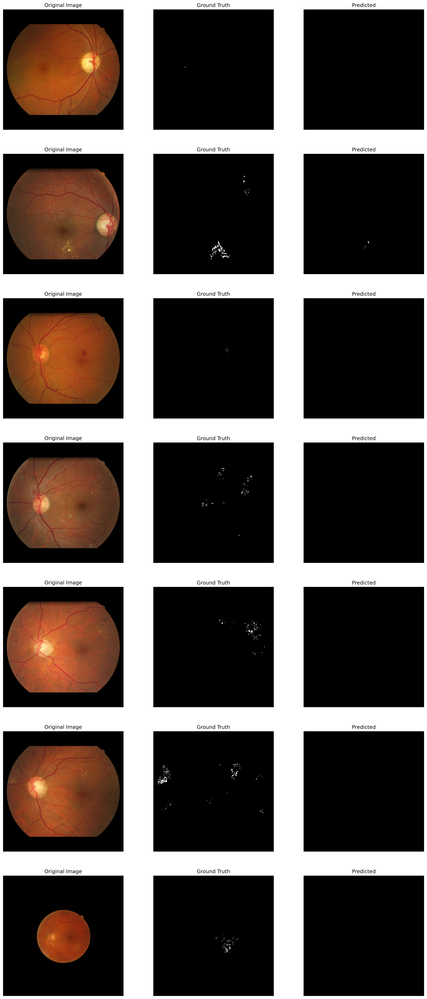

In [7]:

fig, ax = plt.subplots(nrows = 7, ncols = 3, figsize = (18, 7*6), dpi = 300)
imgs, masks = next(iter(test_loader))
for i in tqdm(range(7)):
    dice_coeff_ep = 0
    jaccard_indx =0
    f1_ep = 0
    img = imgs[i]
    mask = masks[i].numpy()
    mask[mask == 1] == 255
    with torch.no_grad():
        output = model(img.unsqueeze(0))
        _, pred_mask = output.max(1)
        pred_mask = pred_mask.squeeze(0).numpy()
        pred_mask[pred_mask == 1] = 255
        # images = imgs[i].to(device)
        # masks = masks[i].to(device).long()
        # outputs = model(images.unsqueeze(0))
        # _, pred = outputs.max(1)

        # dice_coeff_ep = dice(pred.detach(), masks.to(device).unsqueeze(1), average = 'weighted', num_classes = 2)
        # jaccard_indx = ji(pred.detach(), masks.to(device).unsqueeze(1), 2)
        # f1_ep = f1_score(pred.detach(), masks.to(device).unsqueeze(1), average = 'macro', mdmc_average= 'global', num_classes = 2)
        # else:
        #     dice_coeff_ep = dice(pred.detach().float(), masks.to(device).unsqueeze(1))
        #     jaccard_indx = ji(pred.detach().float(), masks.to(device).unsqueeze(1), 2)
        #     f1_ep = f1_score(pred.detach().float(), masks.to(device).unsqueeze(1), average = 'macro', mdmc_average= 'global', num_classes = 2)
    img = img.permute(1,2,0).numpy()
    ax[i,0].imshow(img)
    ax[i,0].set_title('Original Image')
    ax[i,0].axis('off')
    ax[i,1].set_title('Ground Truth')
    ax[i,1].imshow(mask, cmap = 'gray')
    ax[i,1].axis('off')
    ax[i,2].set_title('Predicted')#, dice coeff={dice_coeff_ep}, Jac Index={jaccard_indx}, F1 Score={f1_ep}'.format(dice_coeff_ep=dice_coeff_ep,jaccard_indx=jaccard_indx,f1_ep=f1_ep), fontsize = 10)
    ax[i,2].imshow(pred_mask, cmap = 'gray')
    ax[i,2].axis('off')
plt.savefig('/home/faisal/UNext/7.1.e_optha_EX/Hard Exudates lr_0.01/UNext_pred_Hard Exudates.png')
plt.show()

In [8]:
criterion = nn.CrossEntropyLoss()
validate(model, test_loader, epoch=1)

(0.005373914260417223, tensor(0.9974), tensor(0.5046), tensor(0.5104))

In [9]:
criterion = nn.CrossEntropyLoss()
validate(model, val_loader, epoch=1)

(0.0236030425876379, tensor(0.9955), tensor(0.5267), tensor(0.5527))